In [416]:
import numpy as np
import os
import pyloudnorm as pyln
from openai import OpenAI

import sys, random  
sys.path.insert(0, '../')
import utils
from utils.audio_generation import sample, get_model, sample_multiple
from utils.audio_processing import compress_spectrogram_simple, compress_spectrogram_with_centroid, \
equalize_audio, butter_bandpass_filter, pitch_shift_centroid,change_loudness

from IPython.display import Audio, display
from ipywidgets import widgets

%matplotlib inline
import matplotlib.pyplot as plt

import librosa

In [345]:
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
import warnings

def fxn():
    warnings.warn("deprecated", DeprecationWarning)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fxn()

In [4]:
# model_name = 'audioldm_16k_crossattn_t5' # Smaller model; Less GPU memory ~[6-9]GB; 
model_name = 'audioldm2-full' # Larger model; More GPU memory ~[12-15] GB; 

#Audio params
loudness_dbfs = -14.0
sample_rate = 16000
stft_channels = 1024
hop_length = 128

# Diffusion params
guidance_scale = 3
n_candidates = 1
batch_size = 1
ddim_steps = 100

In [5]:
os.environ["TOKENIZERS_PARALLELISM"] = "false"

In [6]:
latent_diffusion = get_model(model_name)

Loading model
Loading AudioLDM-2: audioldm2-full
Loading model on cuda:0
{'log_directory': './log/audiomae_pred', 'precision': 'high', 'data': {'train': ['audiocaps', 'audioset', 'wavcaps', 'audiostock_music_250k', 'free_to_use_sounds', 'epidemic_sound_effects', 'vggsound', 'million_song_dataset'], 'val': 'audiocaps', 'test': 'audiocaps', 'class_label_indices': 'audioset', 'dataloader_add_ons': ['extract_kaldi_fbank_feature', 'extract_vits_phoneme_and_flant5_text', 'waveform_rs_48k']}, 'variables': {'sampling_rate': 16000, 'mel_bins': 64, 'latent_embed_dim': 8, 'latent_t_size': 256, 'latent_f_size': 16, 'in_channels': 8, 'optimize_ddpm_parameter': True, 'warmup_steps': 5000}, 'step': {'validation_every_n_epochs': 1, 'save_checkpoint_every_n_steps': 5000, 'limit_val_batches': 10, 'max_steps': 1500000, 'save_top_k': 2}, 'preprocessing': {'audio': {'sampling_rate': 16000, 'max_wav_value': 32768, 'duration': 10.24}, 'stft': {'filter_length': 1024, 'hop_length': 160, 'win_length': 1024}, 'm

# Foley Interpreter

In [7]:
with open('../config/.env', 'r') as fh:
    vars_dict = dict(
        tuple(line.replace('\n', '').split('='))
        for line in fh.readlines() if not line.startswith('#')
    )

os.environ.update(vars_dict)

In [393]:
client = OpenAI()

def foley_interpreter(txt):
    # content = "Describe a language phrase consisting of a noun verb adjective adverb like "+\
    #         "'a brown cat running purposefully and quickly' that would be a sound which could be also perceivable "+\
    #         "as touch sensation and resembles "+txt+". Use simple words and long descriptions when generating the language phrase. "+\
    #         "Ensure the language phrase is in double quotes."
    content = "Describe a language phrase consisting of a noun, verb, adverb like "+\
                "'a brown cat running purposefully and quickly' that resembles '"+txt.lower()+"' and indicates a sound event occurring and "+\
                "which is also perceivable as a touch sensation. "+\
                "Use simple words when generating the language phrase. Ensure the language phrase is in double quotes."

    content = "Generate a language phrase that resembles '"+txt.lower()+"' and describes the occurrence of a sound event. "+\
                 "The language phrase should consist of a noun, verb, and adverb. The sound event should also be perceivable as a touch sensation. "+\
                 "Use simple words when generating the language phrase. Ensure the language phrase is in double quotes."

    content = "Generate a YouTube caption for a video that resembles '"+txt.lower()+"' and describes the occurrence of a sound event. "+\
                 "The caption should indicate that the sound event is also perceivable as a touch sensation. "+\
                 "Use simple words when generating the caption. Exclude emoticons, symbols, and ASCII characters from the caption. Ensure that the caption is in double-quotes. "


    content = "Generate a caption for a video that shows a '"+txt.lower()+"' and describes the occurrence of the sound in the video. "+\
                 "The caption should indicate that the sound is also perceivable as a touch sensation. "+\
                 "Use simple words when generating the caption. Exclude emoticons, symbols, and ASCII characters from the caption. Ensure that the caption is in double-quotes. "
    print(content)
    response = client.chat.completions.create(
      model="gpt-3.5-turbo",
      messages=[
         {"role": "system", "content": "You are a helpful assistant."},
        {"role": "user", "content": content}
      ]
    )

    foley_language_phrase = response.choices[0].message.content
    print(foley_language_phrase)
    print(foley_language_phrase.split('"')[1])
    return foley_language_phrase.split('"')[1]


# def foley_interpreter_single(txt):
#     # content = "Describe a language phrase consisting of a noun verb adjective adverb like "+\
#     #         "'a brown cat running purposefully and quickly' that would be a sound which could be also perceivable "+\
#     #         "as touch sensation and resembles "+txt+". Use simple words and long descriptions when generating the language phrase. "+\
#     #         "Ensure the language phrase is in double quotes."
#     # content = "Describe a language phrase consisting of a noun, verb, adverb like "+\
#     #             "'a brown cat running purposefully and quickly' that resembles '"+txt.lower()+"' and indicates a sound event occurring and "+\
#     #             "which is also perceivable as a touch sensation. "+\
#     #             "Use simple words when generating the language phrase. Ensure the language phrase is in double quotes."

#     # content = "Generate a language phrase that resembles '"+txt.lower()+"' and describes the occurrence of a sound event. "+\
#     #              "The language phrase should consist of a noun, verb, and adverb. The sound event should also be perceivable as a touch sensation. "+\
#     #              "Use simple words when generating the language phrase. Ensure the language phrase is in double quotes."

#     # content = "Generate a YouTube caption that resembles '"+txt.lower()+"' and describes the occurrence of a sound event. "+\
#     #              "The caption should indicate that the sound event is also perceivable as a touch sensation. "+\
#     #              "Use simple words when generating the caption. Exclude emoticons, symbols, and ASCII characters from the caption. Ensure that the caption is in double-quotes. "

#     content = "Generate a YouTube caption that resembles '"+txt.lower()+"' and describes the occurrence of a single sound event. "+\
#                 "The caption should indicate that the sound event is also perceivable as a touch sensation. "+\
#                 "Use simple words when generating the caption. Exclude emoticons, symbols, and ASCII characters from the caption. Ensure that the caption is in double-quotes. "
#     # "This caption should be descriptive and consist of nouns, verbs, adjectives, and adverbs. "+ \
#     # content = "Generate a caption for a video that resembles '"+txt.lower()+"' and describes the occurrence of a single sound event. "+\
#     #             "This caption should be descriptive and consist of nouns, verbs, adjectives, and adverbs. "+ \
#     #             "The caption should indicate that the sound event is also perceivable as a touch sensation. "+\
#     #             "Use simple words when generating the caption. Exclude emoticons, symbols, and ASCII characters from the caption. Ensure that the caption is in double-quotes. "
    
#     print(content)
#     response = client.chat.completions.create(
#       model="gpt-3.5-turbo",
#       messages=[
#          {"role": "system", "content": "You are a helpful assistant."},
#         {"role": "user", "content": content}
#       ]
#     )

#     foley_language_phrase = response.choices[0].message.content
#     print(foley_language_phrase)
#     print(foley_language_phrase.split('"')[1])
#     return foley_language_phrase.split('"')[1]



    

# AI Audio Generator

In [371]:
def audio_generator(foley_language_phrase, latent_diffusion, random_seed):
    audio = sample(latent_diffusion, foley_language_phrase, batch_size=1, ddim_steps=100, guidance_scale=3.0, \
             random_seed=random_seed, disable_tqdmoutput=False)

    return audio

def audio_generator_multi(foley_language_phrase, latent_diffusion, random_seed):
    audio = sample_multiple(latent_diffusion, foley_language_phrase, n_candidates=3, ddim_steps=100, guidance_scale=3.0, \
             random_seed=random_seed)

    return audio[0][0][0]

In [316]:
loudness_meter = pyln.Meter(sample_rate)

# Dynamic Audio Converter

In [317]:
def audio_post_processor(audio, freq_limit, hop_length, stft_channels, sample_rate, loudness):

    

    print('Processing Original')
    original = change_loudness(audio, loudness, loudness_meter)
    print('Processing Original + Low Pass')
    original_w_lp = butter_bandpass_filter(audio, highcut=1000, fs=sample_rate, lowcut=None, order=2, btype='lowpass')
    print('Processing Original + Low Pass + Pitch Shifted')
    original_w_pitchshifted = pitch_shift_centroid(original_w_lp, limit=250, sample_rate=sample_rate, loudness_meter=loudness_meter, loudness=loudness)
    print('Processing Wav Compressed + Centroid')
    wav_compressed_w_centroid = compress_spectrogram_with_centroid(audio, limit=freq_limit, hop_length=hop_length, stft_channels=stft_channels, \
                                                    sample_rate=sample_rate, loudness_meter=loudness_meter, loudness=loudness)


    print('Processing Original + Equalized')
    original_equalized = equalize_audio(audio, sample_rate, loudness_meter=loudness_meter, loudness=loudness)
    print('Processing Original + Low Pass + Equalized')
    original_w_lp_equalized = equalize_audio(original_w_lp, sample_rate, loudness_meter=loudness_meter, loudness=loudness)
    print('Processing Original + Low Pass + Pitch Shifted + Equalized')
    original_w_pitchshifted_equalized = equalize_audio(original_w_pitchshifted, sample_rate, loudness_meter=loudness_meter, loudness=loudness)
    print('Processing Wav Compressed + Centroid + Equalized')
    wav_compressed_w_centroid_equalized = equalize_audio(wav_compressed_w_centroid, sample_rate, loudness_meter=loudness_meter, loudness=loudness)

    _ = {\
         'Original': original, \
         'Original + Low Pass': original_w_lp, \
         'Original + Low Pass + Pitch Shifted': original_w_pitchshifted, \
         'Wav Compressed + Centroid': wav_compressed_w_centroid, \
         'Original + Equalized ': original_equalized,\
         'Original + Low Pass + Equalized': original_w_lp_equalized,\
         'Original + Low Pass + Pitch Shifted + Equalized': original_w_pitchshifted_equalized, \
         'Wav Compressed + Centroid + Equalized':wav_compressed_w_centroid_equalized\
        }
    return _

# Ablate

In [372]:
def generate_ablations(prompt, latent_diffusion, random_num, freq_limit, hop_length, stft_channels, sample_rate, loudness, single=False):

    loudness_meter = pyln.Meter(sample_rate)
    
    # 1. Full Pipeline = Foley Interpreter + Audio AI + Audio Processing (Compression w/ Centroid + EQ)
    if single:
        foley_language_phrase = foley_interpreter_single(prompt)
    else:
        foley_language_phrase = foley_interpreter(prompt)
    audio_with_foley = audio_generator_multi(foley_language_phrase, latent_diffusion, random_num)
    audio_withfoley_withcompression = compress_spectrogram_with_centroid(audio_with_foley, limit=freq_limit, hop_length=hop_length, stft_channels=stft_channels, \
                                                    sample_rate=sample_rate, loudness_meter=loudness_meter, loudness=loudness)
    audio_withfoley_withcompression = equalize_audio(audio_withfoley_withcompression, sample_rate, loudness_meter=loudness_meter, loudness=loudness)


    # 2. No Foley = Audio AI + Audio Processing (Compression w/ Centroid + EQ)
    print(prompt,'*****')
    audio_without_foley = audio_generator_multi(prompt, latent_diffusion, random_num)
    audio_withoutfoley_withcompression = compress_spectrogram_with_centroid(audio_without_foley, limit=freq_limit, hop_length=hop_length, stft_channels=stft_channels, \
                                                    sample_rate=sample_rate, loudness_meter=loudness_meter, loudness=loudness)
    audio_withoutfoley_withcompression = equalize_audio(audio_withoutfoley_withcompression, sample_rate, loudness_meter=loudness_meter, loudness=loudness)


    # 3. No Audio Processing = Foley Interpreter + Audio AI (w/ Low Pass filter)
    audio_withfoley_withlowpass = butter_bandpass_filter(audio_with_foley, highcut=freq_limit, fs=sample_rate, lowcut=None, order=2, btype='lowpass')

    # 4. NoFoley+NoAudioProcessing = Audio AI  (w/ Low Pass filter)
    audio_withoutfoley_withlowpass = butter_bandpass_filter(audio_without_foley, highcut=freq_limit, fs=sample_rate, lowcut=None, order=2, btype='lowpass')

    
    _ = {\
         'Original with Foley': audio_with_foley,\
         'With Foley+Compression (Full Pipeline)': audio_withfoley_withcompression, \
         'With Foley+Without Compression (LP)': audio_withfoley_withlowpass, \
         'Original without Foley': audio_without_foley,\
         'Without Foley+Compression': audio_withoutfoley_withcompression, \
         'Witout Foley+Without Compression (LP)': audio_withoutfoley_withlowpass\
        }
    return _

# Examples

Random num =  8912
Generate a caption for a video that shows a 'a movie character falling to the ground' and describes the occurrence of the sound in the video. The caption should indicate that the sound is also perceivable as a touch sensation. Use simple words when generating the caption. Exclude emoticons, symbols, and ASCII characters from the caption. Ensure that the caption is in double-quotes. 
"The character's tumble produces a 'thump' that you can almost feel through the screen."
The character's tumble produces a 'thump' that you can almost feel through the screen.
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:16<00:00,  5.91it/s]


Similarity between generated audio and text:
0.28 0.29 0.32
Choose the following indexes as the output: [2]
Mean Spectral Centroid =  398.5956121092057
Loudness before =  -18.354639690671327
Loudness after =  -19.999999999999975
Loudness before =  -18.988897179558197
Loudness after =  -19.999999999999954
A movie character falling to the ground *****
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:17<00:00,  5.88it/s]


Similarity between generated audio and text:
0.23 0.18 0.16
Choose the following indexes as the output: [0]
Mean Spectral Centroid =  1912.1506985411615
Loudness before =  -22.743506151660114
--
Loudness after =  -22.743506151660085
Loudness before =  -20.622463303827637
Loudness after =  -20.000000000000004
num rows= 2


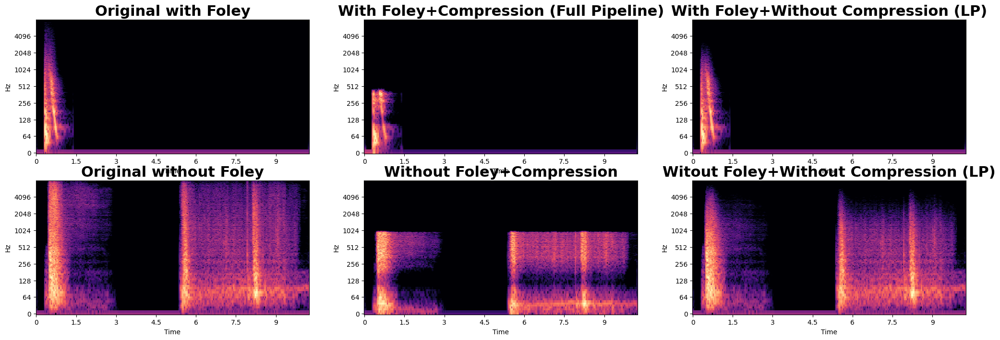

In [410]:
prompt = "A movie character falling to the ground" 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
audio_c = generate_ablations(prompt, latent_diffusion, random_num, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, \
                             sample_rate=sample_rate, loudness=-20)

all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles, num_cols=3)

audio_widgets = []

for aud in all_wavs[:3]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[3:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

In [421]:
audio_c.keys()

dict_keys(['Original with Foley', 'With Foley+Compression (Full Pipeline)', 'With Foley+Without Compression (LP)', 'Original without Foley', 'Without Foley+Compression', 'Witout Foley+Without Compression (LP)'])

In [414]:
char_fall_audio_with_foley = audio_c['Original with Foley']
char_fall_audio_without_foley = audio_c['Original without Foley']

In [420]:
onset_frames = librosa.onset.onset_detect(y=char_fall_audio_with_foley, sr=sample_rate)
onset_times = librosa.frames_to_time(onset_frames)

print(onset_frames,onset_times)

[11 12] [0.2554195  0.27863946]


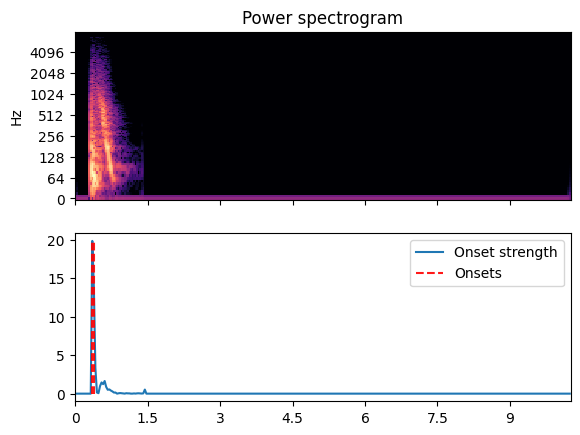

In [418]:
D = np.abs(librosa.stft(char_fall_audio_with_foley))
fig, ax = plt.subplots(nrows=2, sharex=True)
librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max),
                         x_axis='time', y_axis='log', ax=ax[0], sr=sample_rate)
ax[0].set(title='Power spectrogram')
ax[0].label_outer()
ax[1].plot(times, o_env, label='Onset strength')
ax[1].vlines(times[onset_frames], 0, o_env.max(), color='r', alpha=0.9,
           linestyle='--', label='Onsets')
ax[1].legend()

Random num =  7865
Generate a caption for a video that shows a 'a car crashes into another car' and describes the occurrence of the sound in the video. The caption should indicate that the sound is also perceivable as a touch sensation. Use simple words when generating the caption. Exclude emoticons, symbols, and ASCII characters from the caption. Ensure that the caption is in double-quotes. 
"CRUNCH! Feel the impact as these cars collide, the sound resonating like a tangible collision."
CRUNCH! Feel the impact as these cars collide, the sound resonating like a tangible collision.
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:16<00:00,  5.98it/s]


Similarity between generated audio and text:
0.32 0.25 0.31
Choose the following indexes as the output: [0]
Mean Spectral Centroid =  2239.7767527751535
Loudness before =  -21.338339001094266
--
Loudness after =  -21.338339001094255
Loudness before =  -22.249587631193243
--
Loudness after =  -22.249587631193243
A car crashes into another car *****
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:16<00:00,  5.89it/s]


Similarity between generated audio and text:
0.05 0.11 0.27
Choose the following indexes as the output: [2]
Mean Spectral Centroid =  2056.881077085062
Loudness before =  -20.42440099061939
Loudness after =  -20.000000000000007
Loudness before =  -21.463515589456637
--
Loudness after =  -21.46351558945665
num rows= 2


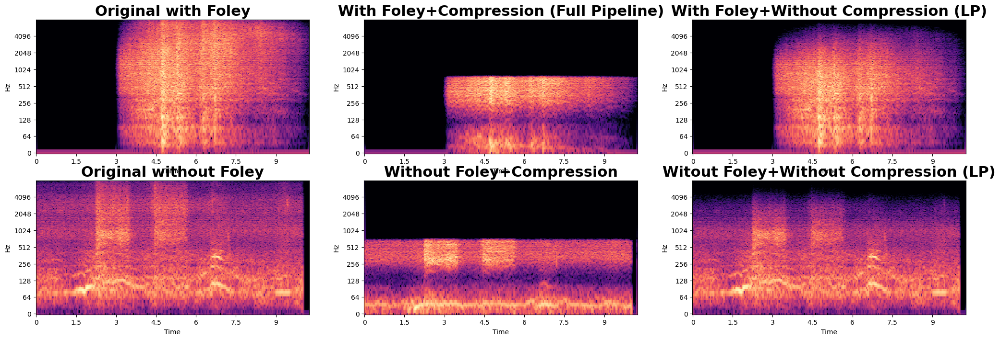

In [395]:
prompt = "A car crashes into another car" 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
audio_c = generate_ablations(prompt, latent_diffusion, random_num, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, \
                             sample_rate=sample_rate, loudness=-20)

all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles, num_cols=3)

audio_widgets = []
for aud in all_wavs[:3]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[3:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

Random num =  5681
Generate a caption for a video that shows a 'raindrops falling on the hand' and describes the occurrence of the sound in the video. The caption should indicate that the sound is also perceivable as a touch sensation. Use simple words when generating the caption. Exclude emoticons, symbols, and ASCII characters from the caption. Ensure that the caption is in double-quotes. 
"Listen closely to the soothing sound of raindrops meeting your skin, evoking a gentle touch sensation."
Listen closely to the soothing sound of raindrops meeting your skin, evoking a gentle touch sensation.
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:16<00:00,  5.89it/s]


Similarity between generated audio and text:
0.19 0.30 0.10
Choose the following indexes as the output: [1]
Mean Spectral Centroid =  838.4693337219657
Loudness before =  -14.570619464860288
Loudness after =  -19.999999999999996
Loudness before =  -13.357277071750927
Loudness after =  -20.0
Raindrops falling on the hand *****
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:16<00:00,  5.91it/s]


Similarity between generated audio and text:
0.35 0.36 0.11
Choose the following indexes as the output: [1]
Mean Spectral Centroid =  3363.2921640045197
Loudness before =  -21.761578290159576
--
Loudness after =  -21.761578290159576
Loudness before =  -22.27187643598669
--
Loudness after =  -22.27187643598669
num rows= 2


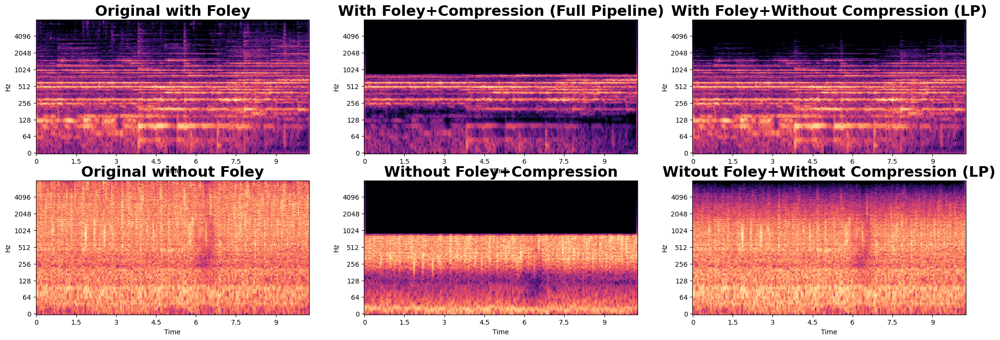

In [396]:
prompt = "Raindrops falling on the hand" 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
audio_c = generate_ablations(prompt, latent_diffusion, random_num, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, \
                             sample_rate=sample_rate, loudness=-20)

all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles, num_cols=3)

audio_widgets = []
for aud in all_wavs[:3]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[3:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

Random num =  8336
Generate a caption for a video that shows a 'confirming a menu item on a desktop screen' and describes the occurrence of the sound in the video. The caption should indicate that the sound is also perceivable as a touch sensation. Use simple words when generating the caption. Exclude emoticons, symbols, and ASCII characters from the caption. Ensure that the caption is in double-quotes. 
"Clicking on the 'Confirm Order' button creates a satisfying sound that can almost be felt as a touch sensation."
Clicking on the 'Confirm Order' button creates a satisfying sound that can almost be felt as a touch sensation.
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:16<00:00,  5.93it/s]


Similarity between generated audio and text:
0.07 0.19 0.08
Choose the following indexes as the output: [1]
Mean Spectral Centroid =  439.5063433843372
Loudness before =  -14.936736294736239
Loudness after =  -20.0
Loudness before =  -15.052125865798692
Loudness after =  -19.999999999999996
Confirming a menu item on a desktop screen *****
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:17<00:00,  5.87it/s]


Similarity between generated audio and text:
0.14 0.25 0.11
Choose the following indexes as the output: [1]
Mean Spectral Centroid =  414.64151886712676
Loudness before =  -22.462564370979283
--
Loudness after =  -22.462564370979326
Loudness before =  -22.625074397925495
--
Loudness after =  -22.625074397925513
num rows= 2


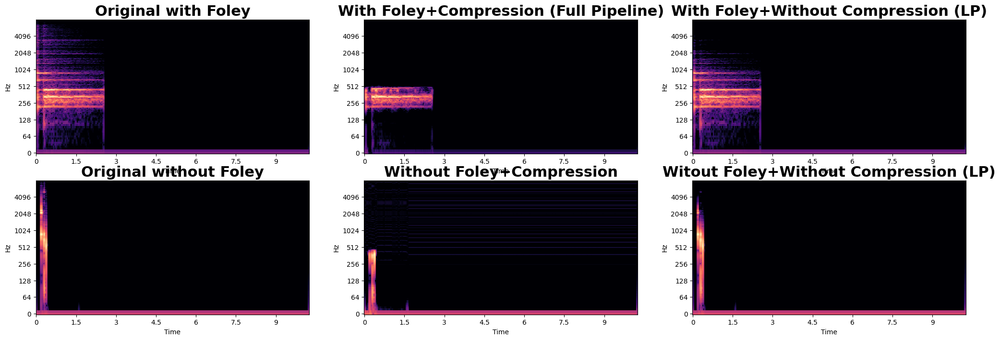

In [397]:
prompt = "Confirming a menu item on a desktop screen" 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
audio_c = generate_ablations(prompt, latent_diffusion, random_num, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, \
                             sample_rate=sample_rate, loudness=-20)

all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles, num_cols=3)

audio_widgets = []
for aud in all_wavs[:3]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[3:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

Random num =  1012
Generate a caption for a video that shows a 'moving a desktop file into the virtual desktop trashcan' and describes the occurrence of the sound in the video. The caption should indicate that the sound is also perceivable as a touch sensation. Use simple words when generating the caption. Exclude emoticons, symbols, and ASCII characters from the caption. Ensure that the caption is in double-quotes. 
"Watch as a desktop file is dragged into the virtual trashcan - listen closely to the satisfying click and feel the smooth touch sensation."
Watch as a desktop file is dragged into the virtual trashcan - listen closely to the satisfying click and feel the smooth touch sensation.
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:16<00:00,  6.00it/s]


Similarity between generated audio and text:
0.30 0.09 0.24
Choose the following indexes as the output: [0]
Mean Spectral Centroid =  2817.0023721530933
Loudness before =  -20.76283154409774
Loudness after =  -20.000000000000004
Loudness before =  -20.70689190855574
Loudness after =  -20.0
Moving a desktop file into the virtual desktop trashcan *****
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:17<00:00,  5.86it/s]


Similarity between generated audio and text:
0.09 0.08 0.15
Choose the following indexes as the output: [2]
Mean Spectral Centroid =  2170.974894263155
Loudness before =  -22.990576356122993
--
Loudness after =  -22.990576356122993
Loudness before =  -22.854136477040974
--
Loudness after =  -22.854136477040974
num rows= 2


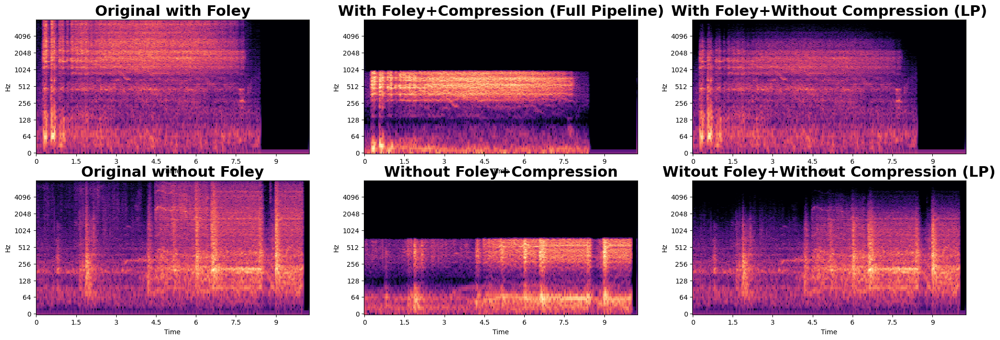

In [398]:
prompt = "Moving a desktop file into the virtual desktop trashcan" 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
audio_c = generate_ablations(prompt, latent_diffusion, random_num, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, \
                             sample_rate=sample_rate, loudness=-20)

all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles, num_cols=3)

audio_widgets = []
for aud in all_wavs[:3]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[3:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

Random num =  7510
Generate a caption for a video that shows a 'receiving a happy message' and describes the occurrence of the sound in the video. The caption should indicate that the sound is also perceivable as a touch sensation. Use simple words when generating the caption. Exclude emoticons, symbols, and ASCII characters from the caption. Ensure that the caption is in double-quotes. 
"Receiving joy: Hear the sound of happiness, feel it like a gentle touch."
Receiving joy: Hear the sound of happiness, feel it like a gentle touch.
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:16<00:00,  5.89it/s]


Similarity between generated audio and text:
0.23 0.25 0.27
Choose the following indexes as the output: [2]
Mean Spectral Centroid =  991.0533630672177
Loudness before =  -15.452719531716594
Loudness after =  -19.999999999999996
Loudness before =  -16.658690528928645
Loudness after =  -19.999999999999996
Receiving a happy message *****
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:17<00:00,  5.83it/s]


Similarity between generated audio and text:
-0.10 -0.12 -0.12
Choose the following indexes as the output: [0]
Mean Spectral Centroid =  1328.5119678396154
Loudness before =  -22.980265279955336
--
Loudness after =  -22.980265279955333
Loudness before =  -24.47245541502043
--
Loudness after =  -24.472455415020438
num rows= 2


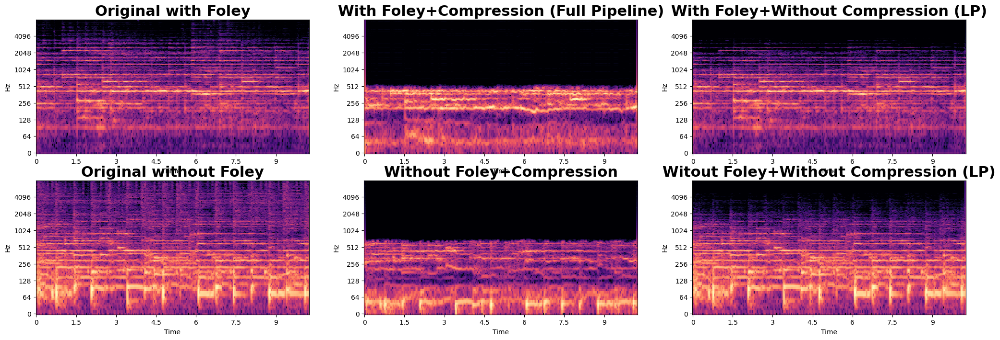

In [399]:
prompt = "Receiving a happy message" 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
audio_c = generate_ablations(prompt, latent_diffusion, random_num, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, \
                             sample_rate=sample_rate, loudness=-20)

all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles, num_cols=3)

audio_widgets = []
for aud in all_wavs[:3]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[3:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

Random num =  4095
Generate a caption for a video that shows a 'receiving a sad message' and describes the occurrence of the sound in the video. The caption should indicate that the sound is also perceivable as a touch sensation. Use simple words when generating the caption. Exclude emoticons, symbols, and ASCII characters from the caption. Ensure that the caption is in double-quotes. 
"Feeling the weight of a sad message - a sound that echoes like a gentle touch"
Feeling the weight of a sad message - a sound that echoes like a gentle touch
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:16<00:00,  5.93it/s]


Similarity between generated audio and text:
-0.02 0.24 -0.05
Choose the following indexes as the output: [1]
Mean Spectral Centroid =  892.776414676684
Loudness before =  -14.493451682782664
Loudness after =  -20.0
Loudness before =  -16.604150078509942
Loudness after =  -20.0
Receiving a sad message *****
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:17<00:00,  5.84it/s]


Similarity between generated audio and text:
0.02 0.38 -0.00
Choose the following indexes as the output: [1]
Mean Spectral Centroid =  857.9827760601687
Loudness before =  -16.71163876767984
Loudness after =  -20.000000000000004
Loudness before =  -16.605463570080893
Loudness after =  -20.0
num rows= 2


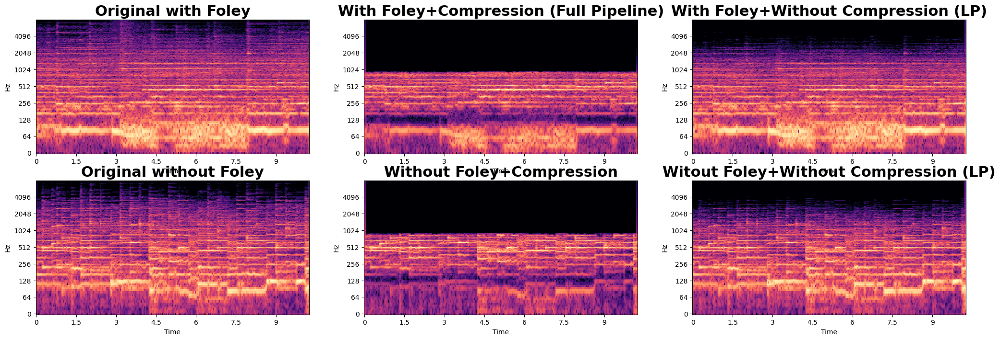

In [400]:
prompt = "Receiving a sad message" 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
audio_c = generate_ablations(prompt, latent_diffusion, random_num, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, \
                             sample_rate=sample_rate, loudness=-20)

all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles, num_cols=3)

audio_widgets = []
for aud in all_wavs[:3]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[3:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

Random num =  2661
Generate a caption for a video that shows a 'receiving an angry message' and describes the occurrence of the sound in the video. The caption should indicate that the sound is also perceivable as a touch sensation. Use simple words when generating the caption. Exclude emoticons, symbols, and ASCII characters from the caption. Ensure that the caption is in double-quotes. 
"Feeling the weight of an angry message as it lands with a harsh tap"
Feeling the weight of an angry message as it lands with a harsh tap
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:16<00:00,  5.93it/s]


Similarity between generated audio and text:
0.06 0.02 0.12
Choose the following indexes as the output: [2]
Mean Spectral Centroid =  212.8873012343423
Loudness before =  -15.524869487711385
Loudness after =  -20.000000000000018
Loudness before =  -18.38647886530836
Loudness after =  -20.00000000000001
Receiving an angry message *****
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:16<00:00,  5.97it/s]


Similarity between generated audio and text:
0.03 0.01 0.01
Choose the following indexes as the output: [0]
Mean Spectral Centroid =  3423.5950578611787
Loudness before =  -16.855159875015538
Loudness after =  -20.0
Loudness before =  -17.035884280873212
Loudness after =  -19.999999999999996
num rows= 2


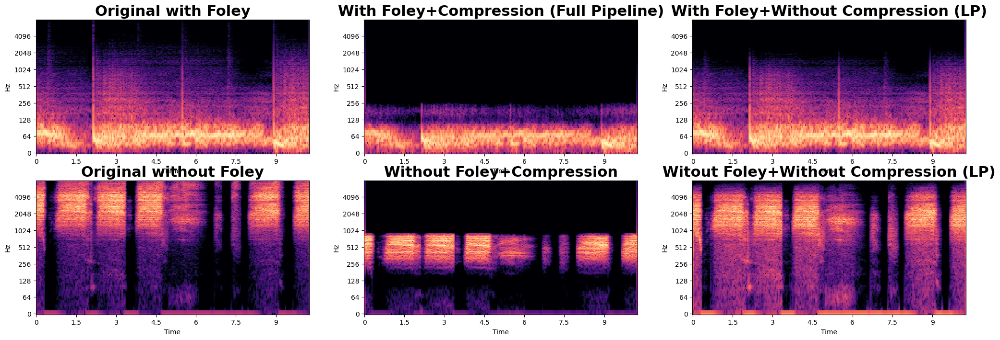

In [401]:
prompt = "Receiving an angry message" 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
audio_c = generate_ablations(prompt, latent_diffusion, random_num, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, \
                             sample_rate=sample_rate, loudness=-20)

all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles, num_cols=3)

audio_widgets = []
for aud in all_wavs[:3]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[3:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

Random num =  9037
Generate a caption for a video that shows a 'sad emotion' and describes the occurrence of the sound in the video. The caption should indicate that the sound is also perceivable as a touch sensation. Use simple words when generating the caption. Exclude emoticons, symbols, and ASCII characters from the caption. Ensure that the caption is in double-quotes. 
"Sorrowful melody that feels like a gentle embrace"
Sorrowful melody that feels like a gentle embrace
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:17<00:00,  5.72it/s]


Similarity between generated audio and text:
0.04 0.01 0.01
Choose the following indexes as the output: [0]
Mean Spectral Centroid =  755.7221761861019
Loudness before =  -14.535137766416632
Loudness after =  -19.999999999999996
Loudness before =  -15.070953809028731
Loudness after =  -19.999999999999996
sad emotion *****
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:17<00:00,  5.84it/s]


Similarity between generated audio and text:
0.22 0.19 0.08
Choose the following indexes as the output: [0]
Mean Spectral Centroid =  2113.93249781247
Loudness before =  -15.60512659870553
Loudness after =  -20.000000000000004
Loudness before =  -16.426831160724117
Loudness after =  -20.000000000000004
num rows= 2


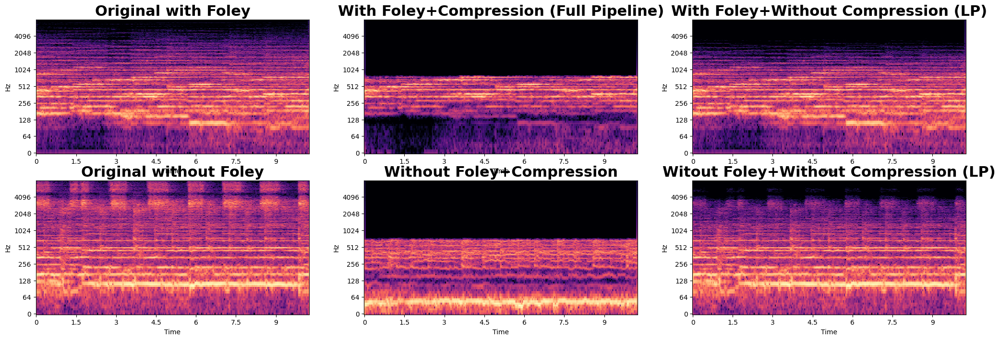

In [404]:
prompt = "sad emotion" 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
audio_c = generate_ablations(prompt, latent_diffusion, random_num, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels,\
                             sample_rate=sample_rate, loudness=-20)

all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles, num_cols=3)

audio_widgets = []
for aud in all_wavs[:3]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[3:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

Random num =  7623
Generate a caption for a video that shows a 'feeling joyous' and describes the occurrence of the sound in the video. The caption should indicate that the sound is also perceivable as a touch sensation. Use simple words when generating the caption. Exclude emoticons, symbols, and ASCII characters from the caption. Ensure that the caption is in double-quotes. 
"Feeling joyous: Listen to the sound of laughter that feels like a warm hug"
Feeling joyous: Listen to the sound of laughter that feels like a warm hug
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:17<00:00,  5.80it/s]


Similarity between generated audio and text:
0.01 0.31 -0.05
Choose the following indexes as the output: [1]
Mean Spectral Centroid =  933.5351697981122
Loudness before =  -19.34592655409731
Loudness after =  -19.999999999999996
Loudness before =  -15.842384436168086
Loudness after =  -20.0
feeling joyous *****
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:16<00:00,  5.91it/s]


Similarity between generated audio and text:
0.16 0.51 0.14
Choose the following indexes as the output: [1]
Mean Spectral Centroid =  2258.6518400762707
Loudness before =  -19.50321943288509
Loudness after =  -20.000000000000004
Loudness before =  -20.215328390153665
Loudness after =  -20.0
num rows= 2


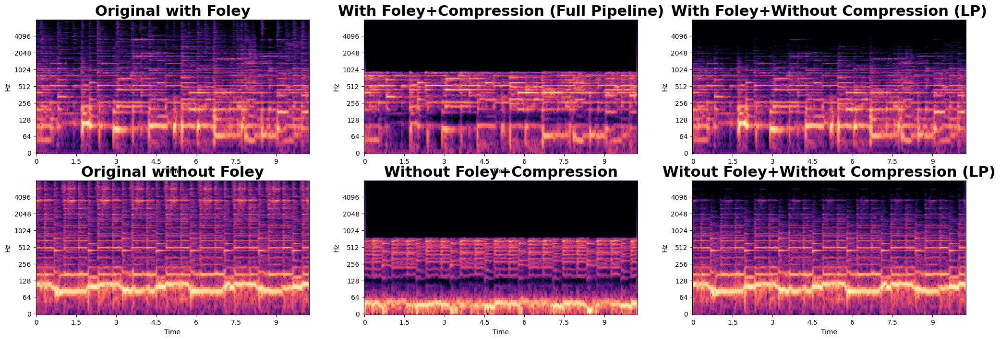

In [405]:
prompt = "feeling joyous" 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
audio_c = generate_ablations(prompt, latent_diffusion, random_num, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, \
                             sample_rate=sample_rate, loudness=-20)

all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles, num_cols=3)

audio_widgets = []
for aud in all_wavs[:3]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[3:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

Random num =  1965
Generate a caption for a video that shows a 'selecting option in the menu. getting tapped on.' and describes the occurrence of the sound in the video. The caption should indicate that the sound is also perceivable as a touch sensation. Use simple words when generating the caption. Exclude emoticons, symbols, and ASCII characters from the caption. Ensure that the caption is in double-quotes. 
"Experience the satisfying tap and select sound as you navigate through the menu options."
Experience the satisfying tap and select sound as you navigate through the menu options.
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:16<00:00,  5.92it/s]


Similarity between generated audio and text:
0.20 0.17 0.32
Choose the following indexes as the output: [2]
Mean Spectral Centroid =  458.9231603776188
Loudness before =  -23.3678835895418
--
Loudness after =  -23.367883589541822
Loudness before =  -24.225492280931586
--
Loudness after =  -24.2254922809316
Selecting option in the menu. Getting tapped on. *****
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:16<00:00,  5.92it/s]


Similarity between generated audio and text:
0.33 0.23 0.32
Choose the following indexes as the output: [0]
Mean Spectral Centroid =  451.3038598059755
Loudness before =  -25.60662528723555
--
Loudness after =  -25.60662528723564
Loudness before =  -23.631863557484635
--
Loudness after =  -23.631863557484657
num rows= 2


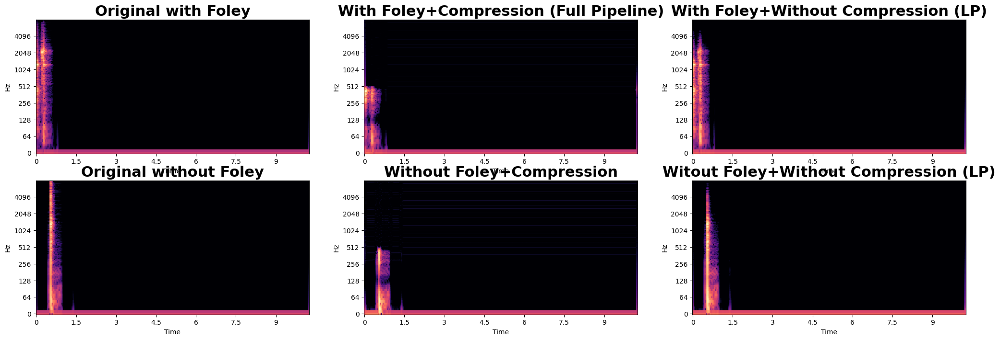

In [406]:
prompt = "Selecting option in the menu. Getting tapped on." 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
audio_c = generate_ablations(prompt, latent_diffusion, random_num, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, \
                             sample_rate=sample_rate, loudness=-20)

all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles, num_cols=3)

audio_widgets = []
for aud in all_wavs[:3]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[3:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

Random num =  2523
Generate a caption for a video that shows a 'selecting option in the menu.' and describes the occurrence of the sound in the video. The caption should indicate that the sound is also perceivable as a touch sensation. Use simple words when generating the caption. Exclude emoticons, symbols, and ASCII characters from the caption. Ensure that the caption is in double-quotes. 
"Selecting an option in the menu generates a satisfying click sound that feels like a tap on your fingertip."
Selecting an option in the menu generates a satisfying click sound that feels like a tap on your fingertip.
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:16<00:00,  5.97it/s]


Similarity between generated audio and text:
-0.04 0.26 0.33
Choose the following indexes as the output: [2]
Mean Spectral Centroid =  378.25649328002123
Loudness before =  -23.899096797686642
--
Loudness after =  -23.899096797686735
Loudness before =  -22.502131098927553
--
Loudness after =  -22.502131098927627
Selecting option in the menu. *****
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:17<00:00,  5.84it/s]


Similarity between generated audio and text:
0.16 0.20 0.27
Choose the following indexes as the output: [2]
Mean Spectral Centroid =  383.6063933252999
Loudness before =  -23.979605239924442
--
Loudness after =  -23.979605239924435
Loudness before =  -25.43608891725516
--
Loudness after =  -25.43608891725516
num rows= 2


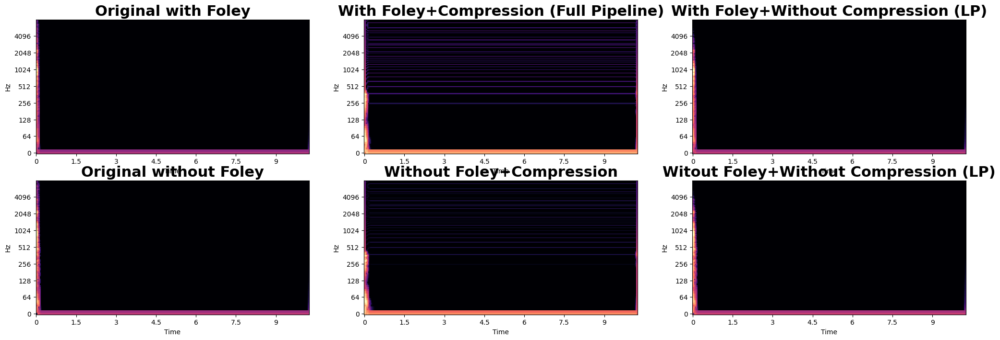

In [407]:
prompt = "Selecting option in the menu." 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
audio_c = generate_ablations(prompt, latent_diffusion, random_num, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, \
                             sample_rate=sample_rate, loudness=-20)

all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles, num_cols=3)

audio_widgets = []
for aud in all_wavs[:3]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[3:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

Random num =  8132
Generate a caption for a video that shows a 'getting tapped on' and describes the occurrence of the sound in the video. The caption should indicate that the sound is also perceivable as a touch sensation. Use simple words when generating the caption. Exclude emoticons, symbols, and ASCII characters from the caption. Ensure that the caption is in double-quotes. 
"Listen closely: that tap on the screen feels like a gentle touch on your skin."
Listen closely: that tap on the screen feels like a gentle touch on your skin.
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:17<00:00,  5.83it/s]


Similarity between generated audio and text:
0.07 0.20 0.10
Choose the following indexes as the output: [1]
Mean Spectral Centroid =  1061.0239155155602
Loudness before =  -19.61994268420782
Loudness after =  -20.000000000000014
Loudness before =  -20.713963185740372
Loudness after =  -20.000000000000025
Getting tapped on *****
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:17<00:00,  5.88it/s]


Similarity between generated audio and text:
-0.07 0.05 -0.03
Choose the following indexes as the output: [1]
Mean Spectral Centroid =  3465.111221337665
Loudness before =  -25.061519618827194
--
Loudness after =  -25.06151961882719
Loudness before =  -25.15152896405799
--
Loudness after =  -25.15152896405799
num rows= 2


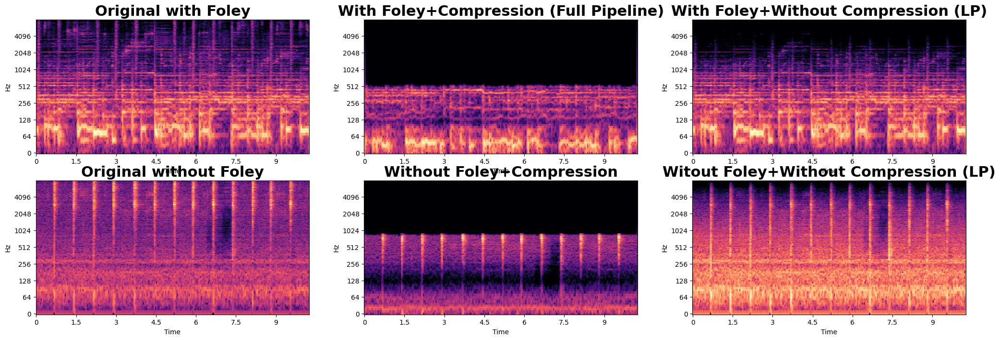

In [408]:
prompt = "Getting tapped on" 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
audio_c = generate_ablations(prompt, latent_diffusion, random_num, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, \
                             sample_rate=sample_rate, loudness=-20)

all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles, num_cols=3)

audio_widgets = []
for aud in all_wavs[:3]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[3:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

Random num =  3791
Generate a caption for a video that shows a 'incoming text message making receiver happy' and describes the occurrence of the sound in the video. The caption should indicate that the sound is also perceivable as a touch sensation. Use simple words when generating the caption. Exclude emoticons, symbols, and ASCII characters from the caption. Ensure that the caption is in double-quotes. 
"Text notification sound feels like a gentle tap on the shoulder."
Text notification sound feels like a gentle tap on the shoulder.
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:17<00:00,  5.76it/s]


Similarity between generated audio and text:
0.02 0.33 0.30
Choose the following indexes as the output: [1]
Mean Spectral Centroid =  413.2648424163492
Loudness before =  -42.667374008839275
--
Loudness after =  -42.66737400883929
Loudness before =  -44.66588278229433
--
Loudness after =  -44.66588278229433
incoming text message making receiver happy *****
Here because x_T is None. x_T shape should be =  (3, 8, 256, 16)
Running DDIM Sampling with 100 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:16<00:00,  5.90it/s]


Similarity between generated audio and text:
0.21 0.15 0.19
Choose the following indexes as the output: [0]
Mean Spectral Centroid =  2440.5259454888255
Loudness before =  -17.94010662138747
Loudness after =  -20.0
Loudness before =  -18.25213453043349
Loudness after =  -20.0
num rows= 2


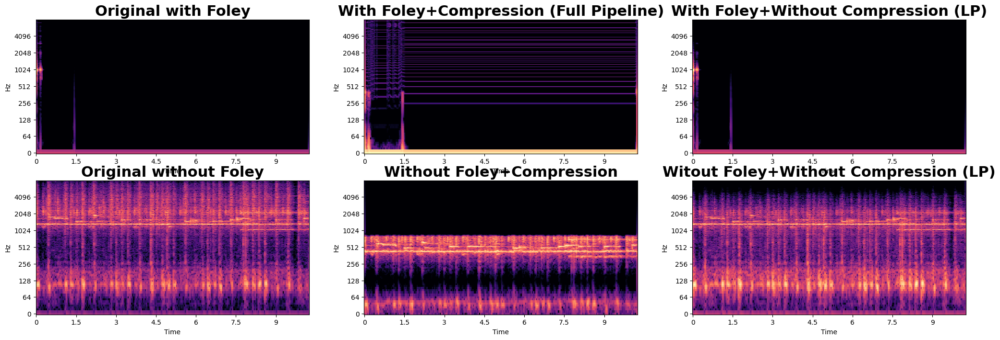

In [409]:
prompt = "incoming text message making receiver happy" 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
audio_c = generate_ablations(prompt, latent_diffusion, random_num, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, \
                             sample_rate=sample_rate, loudness=-20)

all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles, num_cols=3)

audio_widgets = []
for aud in all_wavs[:3]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[3:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate, normalize=False))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])